# AIML PROJECT: SIREN for Single Image Super-Resolution
* Lorenzo Scolaris s278833
* Luca Ambrosino s279634
* Marco Bottino s274110

Table of contents:
1. [Data preparation: importing libraries, images and defining functions](#section_1)
2. [Comparison of a trained ReLU network and a trained SIREN network](#section_2)
3. [Ablation studies on simple SIREN](#section_3)
4. [Simple SIREN for Single Image Super-Resolution](#section_4)
5. [Our variation: composed network for Single Image Super-Resolution](#section_5)


# 1. Data preparation: importing libraries, images and defining functions

##Importing libraries


In [8]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import skimage
import skimage.metrics as sm
import time
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
from torchvision.utils import save_image

##Defining useful functions and classes

In [9]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

def laplace_color(y, x):
    lap_r = laplace(y[:,:,0],x)
    lap_g = laplace(y[:,:,1],x)
    lap_b = laplace(y[:,:,2],x)
    lap = torch.cat([lap_r,lap_g,lap_b],1).permute(1,0)
    return lap

def gradient_color(y, x, grad_outputs=None):
    gr_r = gradient(y[:,:,0],x,grad_outputs).norm(dim=-1)
    gr_g = gradient(y[:,:,1],x,grad_outputs).norm(dim=-1)
    gr_b = gradient(y[:,:,2],x,grad_outputs).norm(dim=-1)
    grad = torch.cat([gr_r,gr_g,gr_b],-2).permute(1,0)
    return grad

def get_cameraman_tensor(sidelength):
    img = Image.fromarray(skimage.data.camera())        
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

def get_mgrid(sidelen, dim=2):
  '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
  sidelen: int
  dim: int'''
  tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
  mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
  mgrid = mgrid.reshape(-1, dim)
  return mgrid

def map_to_01(A,flag=False):
  '''Change the pixel range of an image from -1 ~ 1 to 0 ~ 1. If flag, 
  the original range depends on min and max values of the pixels of the image
  A: torch.tensor
  flag: boolean'''
  if flag: 
    A -= torch.min(A)
    A /= torch.max(A)
  else:
    A = A + 1
    A = A/2
  return A

def def_requires_grad(model,freezer=False):
  '''Recursive function that change the requires_grad of a module of a network and its children to the value of freezer.
  A module with requires_grad = False is frozen and can't be trained until it's switched back to True
  freezer: boolean'''
  for name, child in model.named_children():
      for param in child.parameters():
          param.requires_grad = freezer
      def_requires_grad(child,freezer)

def check_grad(model):
  '''Print the requires_grad values of all the layers in the network
  model: nn.Module'''
  for name, child in model.named_children():
    print(child)
    for param in child.parameters():
        print(param.requires_grad)
    check_grad(child)

def prep_image(img,sidelength):
  '''Preprocess an image by cropping it and resizing to a torch.tensor of size (sidelength,sidelength,3).
  Also returns a square grid of coordinates of size sidelengthxsidelength
  img: PIL Image
  sidelength: int'''

  #Converts the image to RGB if B/W
  if img.mode=='L':
    img= img.convert('RGB')

  #Crops the image to a square of side equal to the minimum between width and height
  w,h = img.size #w = width, h = height
  if (h<=w):
    img = img.crop((w/2 - h/2, 0, w/2 + h/2, h))
  else:
    img = img.crop((0,h/2-w/2,w,h/2+w/2))

  #Transform the image into torch.tensor format of size (sidelength, sidelenght.3)
  red, green, blue = img.split()
  transform = Compose([
  Resize(sidelength),
  ToTensor(),
  Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
  ])
  red = transform(red)
  green = transform(green)
  blue = transform(blue)
  redpixels = red.permute(1, 2, 0).view(-1, 1)
  greenpixels = green.permute(1, 2, 0).view(-1, 1)
  bluepixels = blue.permute(1, 2, 0).view(-1, 1)


  coords = get_mgrid(sidelength, 2)  #return a square grid of side sidelength
  pixels= torch.cat((redpixels,greenpixels,bluepixels),1) #return the transformed image
  return coords,pixels


def load_images_from_folder(folder):
  '''Loads a list of images from a folder
  folder: string'''
  images = []
  for filename in os.listdir(folder):
      #img = Image.open(folder + '/' + img)
      img = Image.open(os.path.join(folder,filename))
      if img is not None:
          images.append(img)
  return images



class ImagePreparation(Dataset):
  '''a class which takes as input a B/W image and preprocess it into a list of coords and pixels of the same image cropped and resized into sidelenght*sidelength
  folder: string
  sidelength: int'''
  def __init__(self, name, sidelength):
      super().__init__()

      img = Image.open(name)        
      transform = Compose([
      Resize(sidelength),
      ToTensor(),
      Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
      ])
      img = transform(img)
      
      self.pixels = img.permute(1, 2, 0).view(-1, 1)
      self.coords = get_mgrid(sidelength, 2)
      
  def __len__(self):
      return 1

  def __getitem__(self, idx):    
      if idx > 0: raise IndexError
          
      return self.coords, self.pixels


class ImagePreparation_color(Dataset):
  '''a class which takes as input a RGB image and preprocess it into a list of coords and pixels of the same image cropped and resized into sidelenght*sidelength
  folder: string
  sidelength: int'''
  def __init__(self, name, sidelength):
      super().__init__()
      img = Image.open(name)
      if img.mode=='L':
        img= img.convert('RGB')
        
      red, green, blue = img.split()
      transform = Compose([
      Resize(sidelength),
      ToTensor(),
      Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
      ])
      red = transform(red)
      green = transform(green)
      blue = transform(blue)
      self.redpixels = red.permute(1, 2, 0).view(-1, 1)
      self.greenpixels = green.permute(1, 2, 0).view(-1, 1)
      self.bluepixels = blue.permute(1, 2, 0).view(-1, 1)
      self.coords = get_mgrid(sidelength, 2)

      self.pixels= torch.cat((self.redpixels,self.greenpixels,self.bluepixels),1)
        
  def __len__(self):
      return 1

  def __getitem__(self, idx):    
      if idx > 0: raise IndexError
      return self.coords, self.pixels

class DatasetImages(Dataset): 
  '''a class which takes as input a folder of images and preprocess them into a list of coords and pixels of the same images cropped and resized into dim*dim
  folder: string
  dim: int'''

  #When the dataset is initialized the following method is called to build the dataset
  def __init__(self, folder, dim):
      super().__init__()
      self.folder = folder
      self.dim = dim
      self.dataset_images = load_images_from_folder(self.folder)
      self.coords_list = []
      self.pixels_list = []
      for img in self.dataset_images:
        c,p = prep_image(img,self.dim)
        self.coords_list.append(c)
        self.pixels_list.append(p)

  #A method to obtain the length of the dataset
  def __len__(self):
      return len(self.coords_list)
      
  #A method to get a single item at the index idx from the dataset
  def __getitem__(self, idx):    
      return self.coords_list[idx], self.pixels_list[idx]


class VGGPerceptualLoss(torch.nn.Module):
  '''a class to evaluate the perceptual loss on the feature maps extracted on different depths of the VGG-16 network'''
  def _init_(self, resize=True):
      super(VGGPerceptualLoss, self)._init_()
      blocks = []
      blocks.append(torchvision.models.vgg16(pretrained=True).features[:4].eval())
      blocks.append(torchvision.models.vgg16(pretrained=True).features[4:9].eval())
      blocks.append(torchvision.models.vgg16(pretrained=True).features[9:16].eval())
      blocks.append(torchvision.models.vgg16(pretrained=True).features[16:23].eval())
      for bl in blocks:
          for p in bl:
              p.requires_grad = False
      self.blocks = torch.nn.ModuleList(blocks)
      self.transform = torch.nn.functional.interpolate
      self.mean = torch.nn.Parameter(torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1))
      self.std = torch.nn.Parameter(torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1))
      self.resize = resize

  def forward(self, input, target):
      if input.shape[1] != 3:
          input = input.repeat(1, 3, 1, 1)
          target = target.repeat(1, 3, 1, 1)
      input = (input-self.mean) / self.std
      target = (target-self.mean) / self.std
      if self.resize:
          input = self.transform(input, mode='bilinear', size=(224, 224), align_corners=False)
          target = self.transform(target, mode='bilinear', size=(224, 224), align_corners=False)
      loss = 0.0
      x = input
      y = target
      loss_slice = []
      for block in self.blocks:
          x = block(x)
          y = block(y)
          loss_slice.append(((torch.flatten(x-y))**2).mean())
      return loss_slice #A vector with all the losses after blocks 1-2, 2-2, 3-3 and 4-3 is returned

## Importing images

In [10]:
#Importing from Github the images. The folder div2k contains 90 images from div2k dataset, whereas test_image contains the image to be tested (baboon.png)
!git clone https://github.com/MarcoBott1997/Project_Siren.git


Cloning into 'Project_Siren'...
remote: Enumerating objects: 66, done.
remote: Counting objects: 100% (66/66), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 171 (delta 9), reused 0 (delta 0), pack-reused 105
Receiving objects: 100% (171/171), 48.00 MiB | 44.40 MiB/s, done.
Resolving deltas: 100% (11/11), done.


In [11]:
cd Project_Siren

/content/Project_Siren/Project_Siren


#2. Comparison of a trained ReLU network and a trained SIREN network

##Defining the networks

###Neural network with ReLU activations

In [ ]:
class ReLU_Layer(nn.Module):

    
    def __init__(self, in_features, out_features, bias=True):
        super().__init__()
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad(): #sets all the requires_grad to false
                self.linear.weight.normal_(0, 0.01)      
            
        
    def forward(self, input):
        return F.relu(self.linear(input))
    
    
class ReLU_Net(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False):

        super().__init__()
        
        self.net = []
        self.net.append(ReLU_Layer(in_features, hidden_features))

        for i in range(hidden_layers):
            self.net.append(ReLU_Layer(hidden_features, hidden_features))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            self.net.append(final_linear)
        else:
            self.net.append(ReLU_Layer(hidden_features, out_features))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords

###SIREN network with periodic sine activations

In [ ]:
class SineLayer(nn.Module):
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30): #isfirst tells us if we are in the first layer or not
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad(): #sets all the requires_grad to false
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

##Comparison in image fitting

###Defining class to extract the image

In [ ]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels

###Initializing dataset and networks

In [ ]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_ReLU = ReLU_Net(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=2, outermost_linear=True)
img_ReLU.cuda()

img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=2, outermost_linear=True, first_omega_0 = 300, hidden_omega_0 = 30)
img_siren.cuda()

Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

###Training the networks

#### Training ReLU

Step 50, Total loss 0.228462


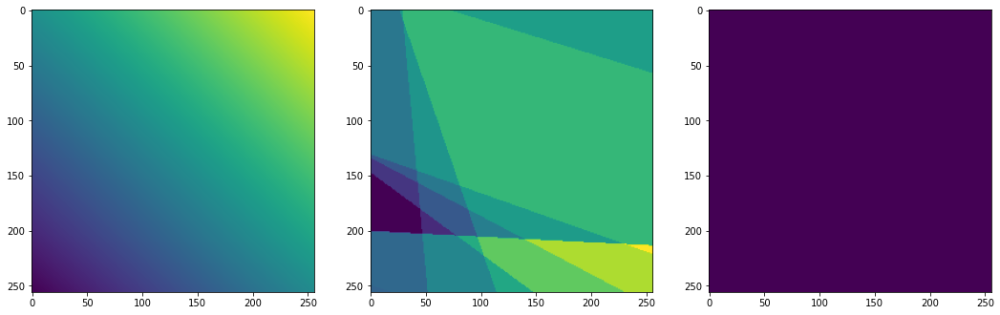

Step 100, Total loss 0.224978


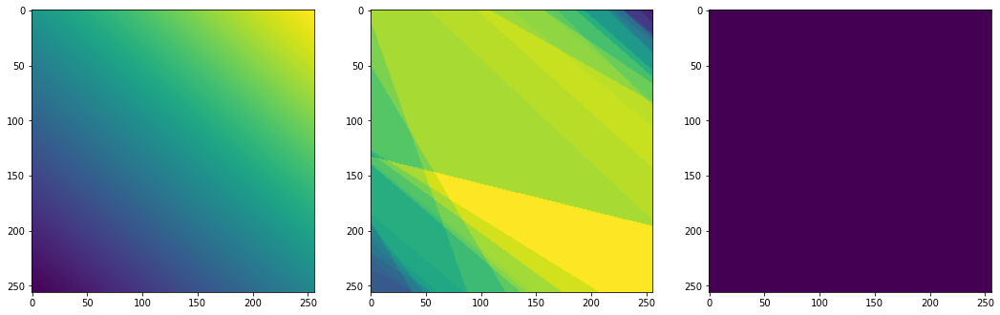

Step 150, Total loss 0.193306


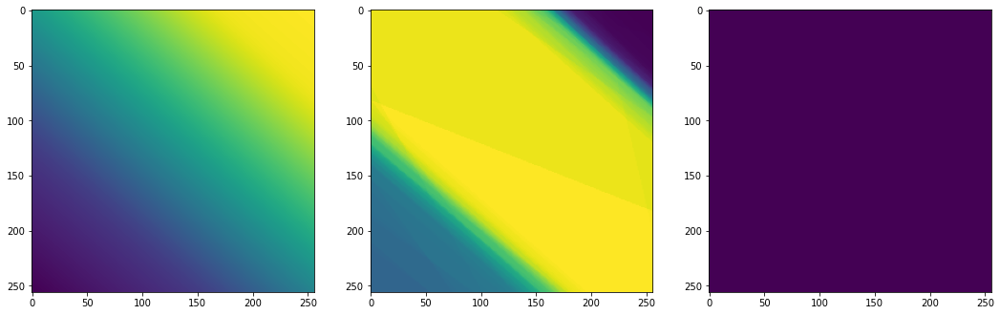

Step 200, Total loss 0.180255


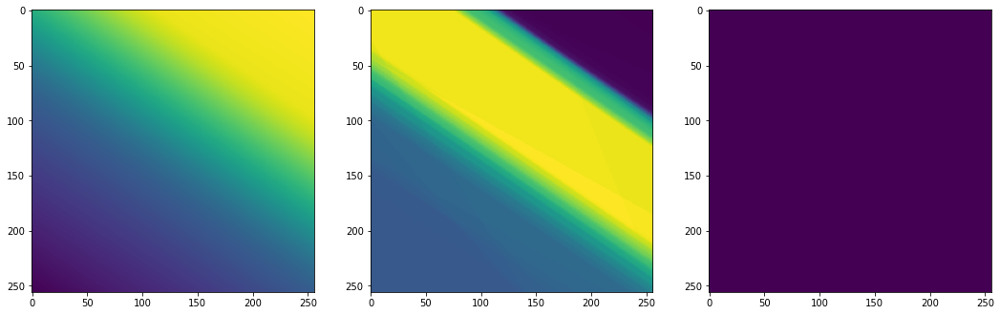

Step 250, Total loss 0.178458


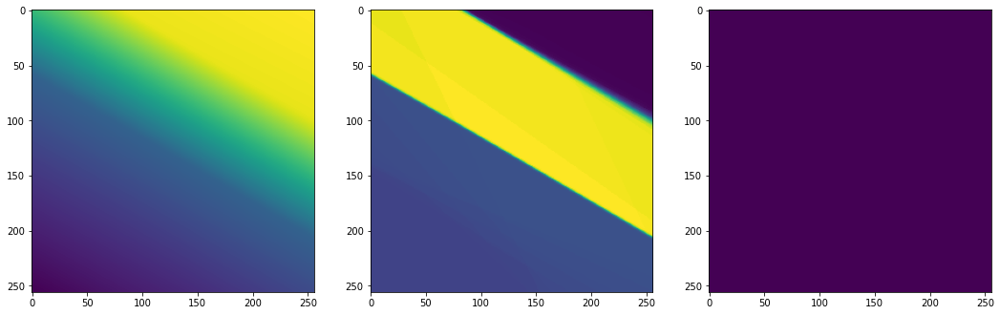

Step 300, Total loss 0.177730


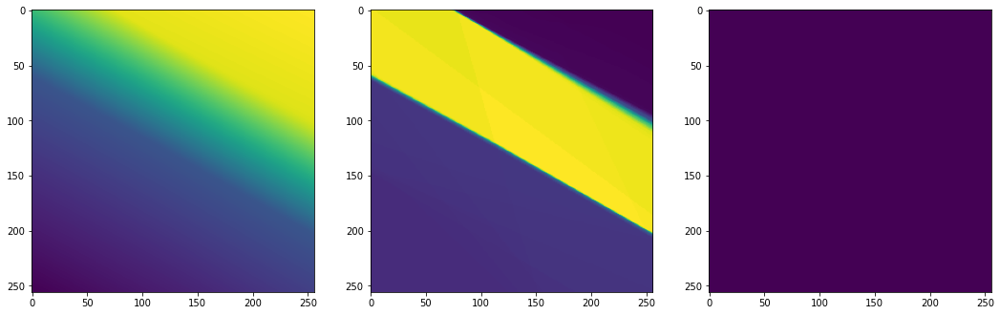

Step 350, Total loss 0.177023


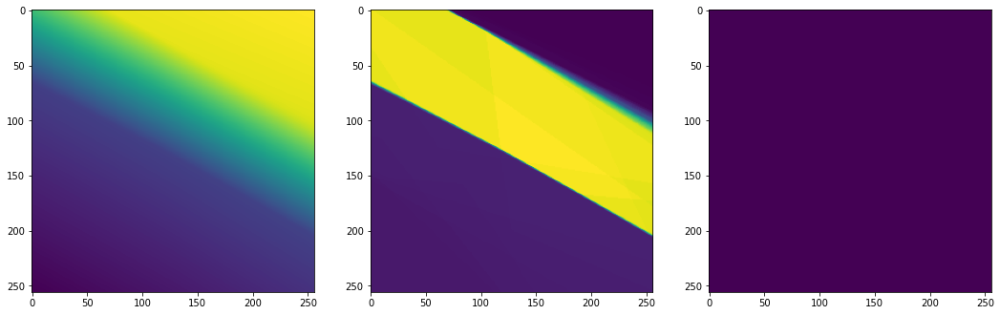

Step 400, Total loss 0.176051


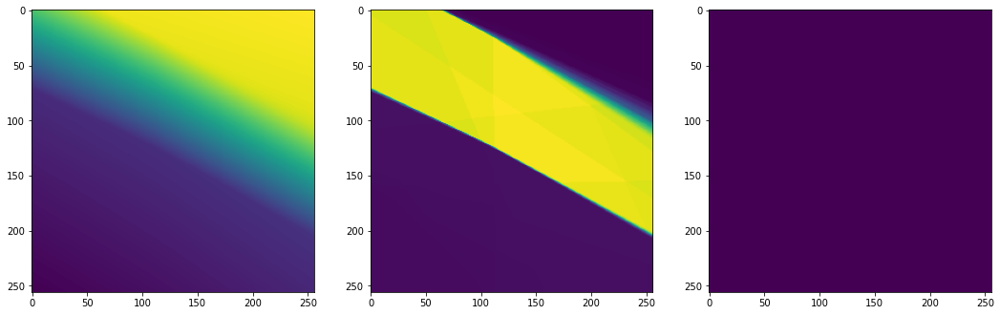

Step 450, Total loss 0.174536


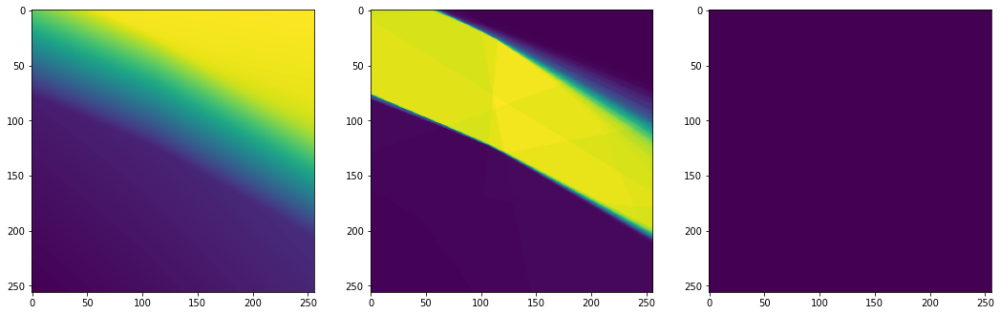

Step 500, Total loss 0.171621


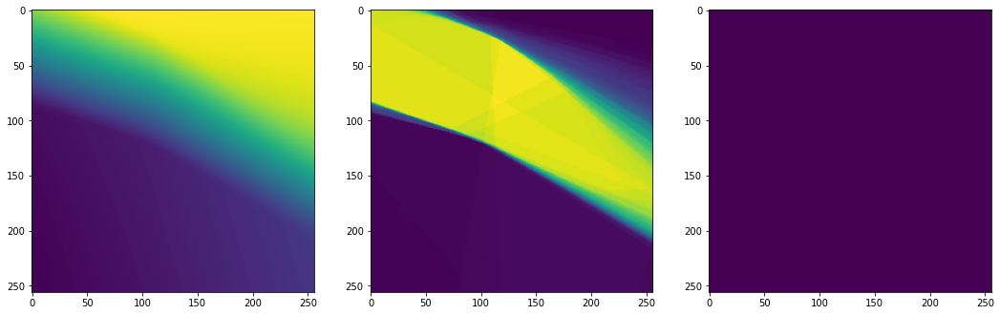

In [ ]:
total_steps = 500 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 50

optim = torch.optim.Adam(lr=1e-4, params=img_ReLU.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output_relu, coords = img_ReLU(model_input)    
    loss = ((model_output_relu - ground_truth)**2).mean()
    
    if step % steps_til_summary == steps_til_summary -1 :
        print("Step %d, Total loss %0.6f" % (step+1, loss))
        img_grad_relu = gradient(model_output_relu, coords)
        img_laplacian_relu = laplace(model_output_relu, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output_relu.cpu().view(256,256).detach().numpy())
        axes[1].imshow(img_grad_relu.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian_relu.cpu().view(256,256).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

#### Training SIREN

Step 0, Total loss 0.229454


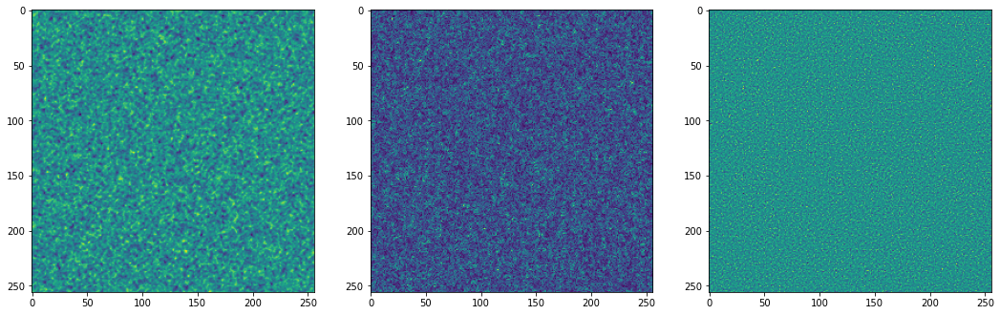

Step 50, Total loss 0.010218


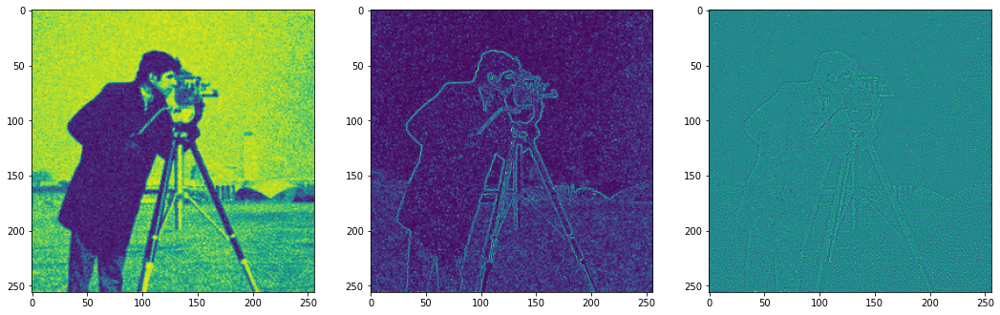

Step 100, Total loss 0.002017


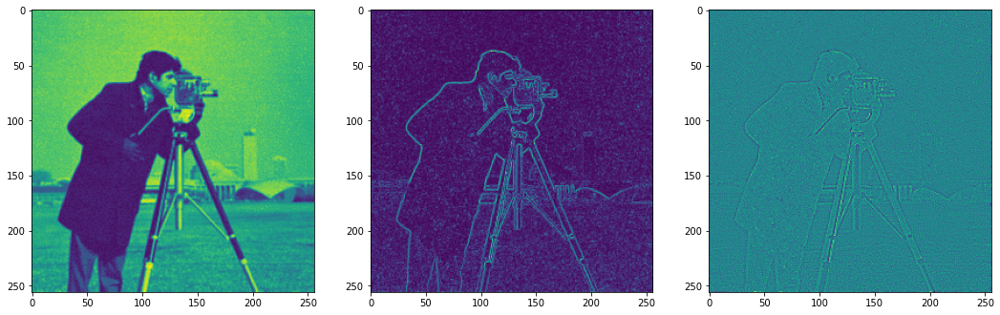

Step 150, Total loss 0.000848


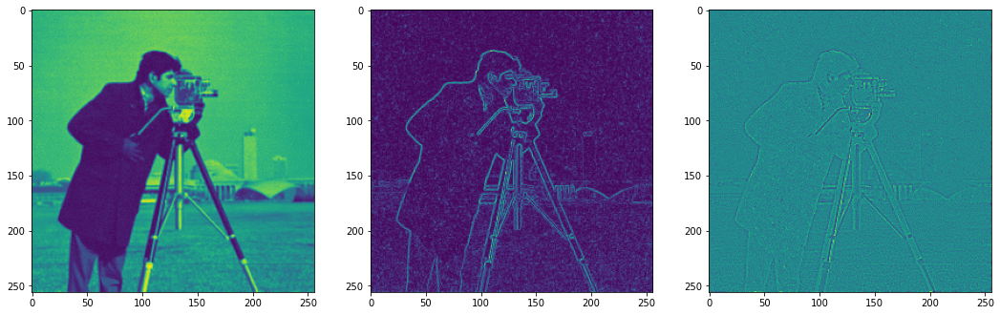

Step 200, Total loss 0.000457


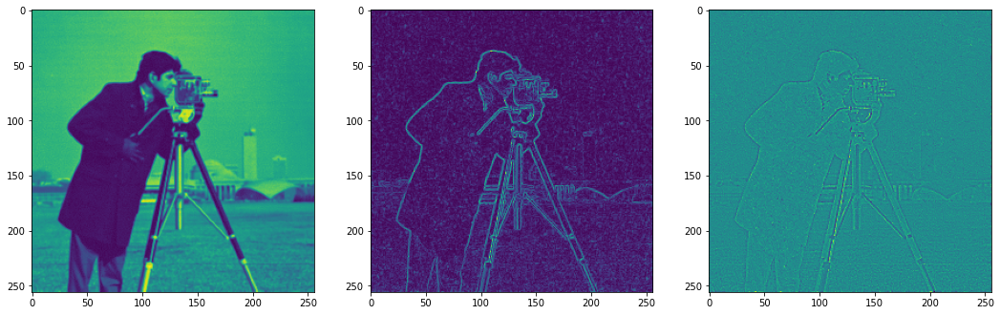

Step 250, Total loss 0.000278


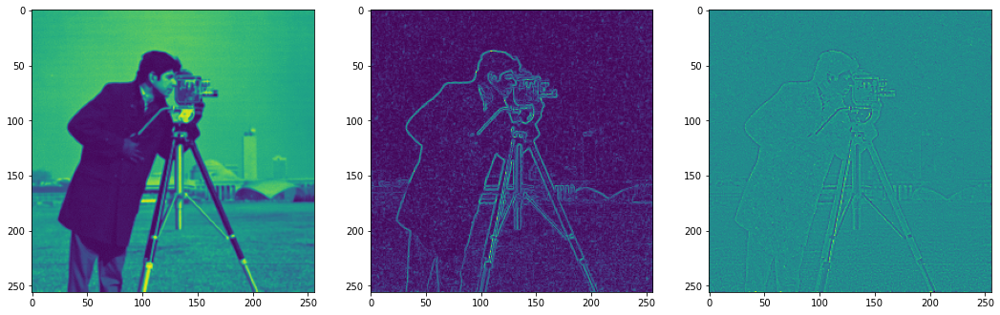

Step 300, Total loss 0.000182


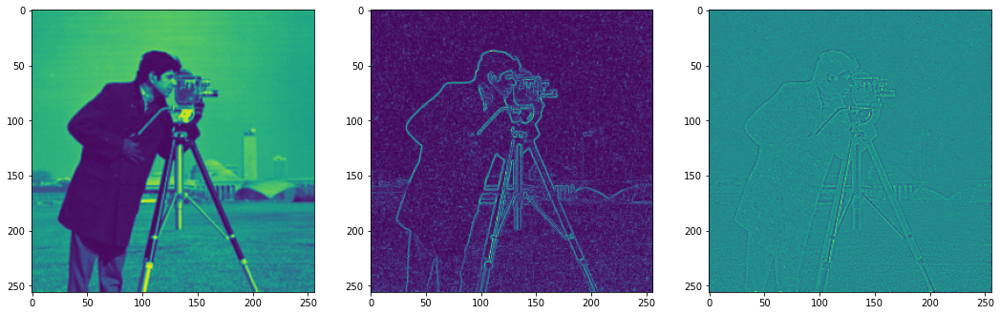

Step 350, Total loss 0.000125


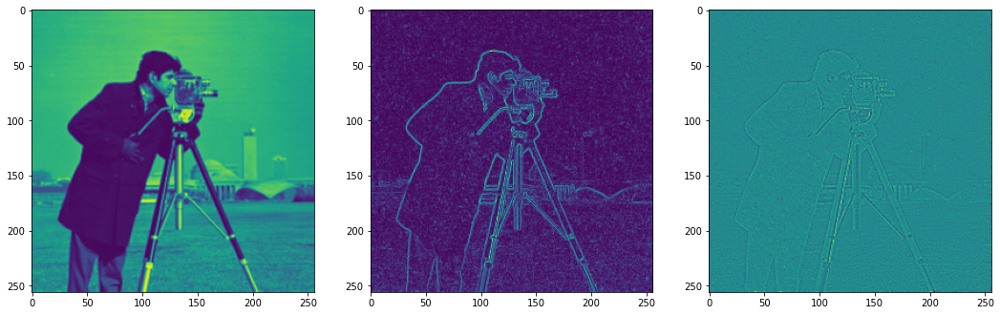

Step 400, Total loss 0.000101


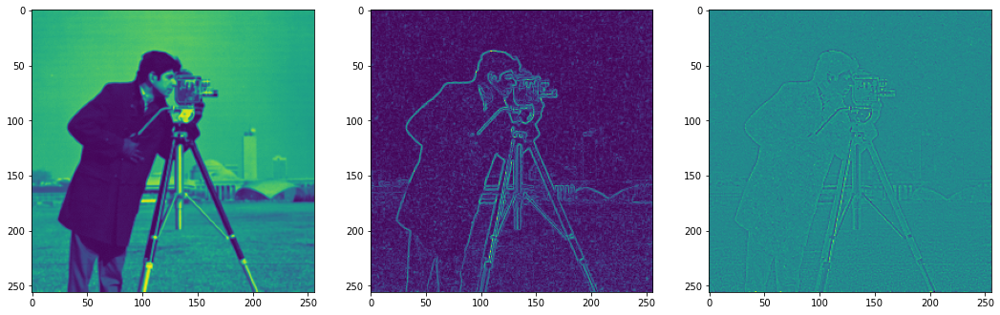

Step 450, Total loss 0.000066


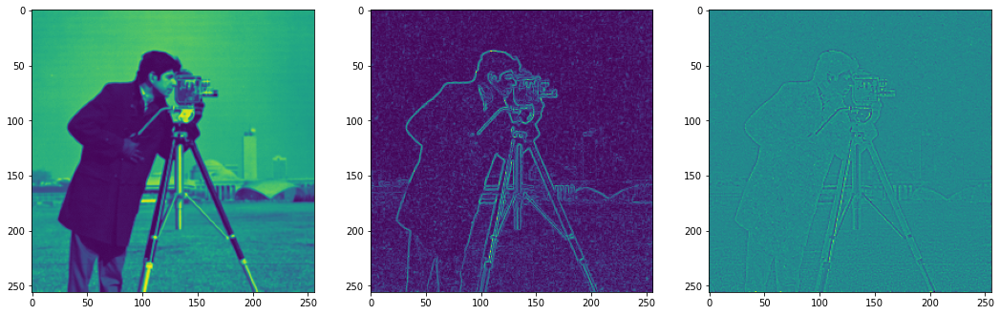

Step 500, Total loss 0.000049


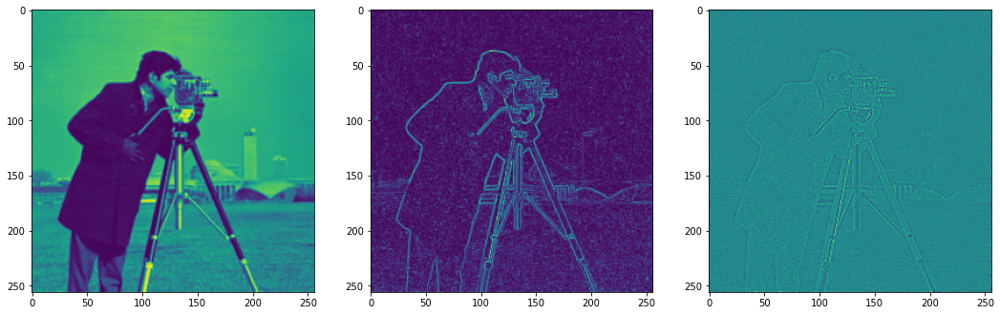

In [ ]:
total_steps = 501 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 50

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren(model_input)    
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

###Comparing results

In [ ]:
gt = ground_truth.to('cpu')
mo_relu = model_output_relu.to('cpu')
mo_sir = model_output.to('cpu')

gt = gt.detach().numpy()
mo_relu = mo_relu.detach().numpy()
mo_sir = mo_sir.detach().numpy()

PSNR_Siren = sm.peak_signal_noise_ratio(gt, mo_sir)
PSNR_ReLU = sm.peak_signal_noise_ratio(gt, mo_relu)

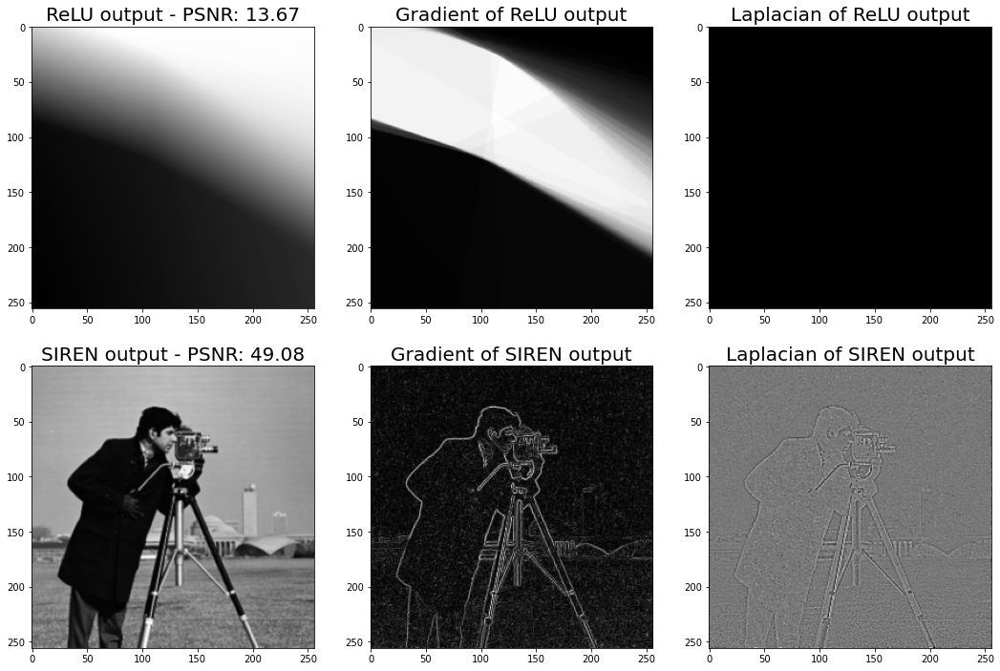

In [ ]:
fig, axes = plt.subplots(2,3, figsize=(18,12))
axes[0,0].imshow(model_output_relu.cpu().view(256,256).detach().numpy(), cmap = "gray")
axes[0,0].set_title("ReLU output - PSNR: %.2f" % (PSNR_ReLU), fontsize=20)
axes[0,1].imshow(img_grad_relu.norm(dim=-1).cpu().view(256,256).detach().numpy(), cmap = "gray")
axes[0,1].set_title("Gradient of ReLU output", fontsize=20)
axes[0,2].imshow(img_laplacian_relu.cpu().view(256,256).detach().numpy(), cmap = "gray")
axes[0,2].set_title("Laplacian of ReLU output", fontsize=20)
axes[1,0].imshow(model_output.cpu().view(256,256).detach().numpy(), cmap = "gray")
axes[1,0].set_title("SIREN output - PSNR: %.2f" % (PSNR_Siren), fontsize=20)
axes[1,1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy(), cmap = "gray")
axes[1,1].set_title("Gradient of SIREN output", fontsize=20)
axes[1,2].imshow(img_laplacian.cpu().view(256,256).detach().numpy(), cmap = "gray")
axes[1,2].set_title("Laplacian of SIREN output", fontsize=20)
plt.show()

## Comparison in audio fitting

###Import audio

In [ ]:
import scipy.io.wavfile as wavfile
import io
from IPython.display import Audio

if not os.path.exists('gt_bach.wav'):
    !wget https://vsitzmann.github.io/siren/img/audio/gt_bach.wav

--2021-02-13 08:32:15--  https://vsitzmann.github.io/siren/img/audio/gt_bach.wav
Resolving vsitzmann.github.io (vsitzmann.github.io)... 185.199.108.153, 185.199.109.153, 185.199.110.153, ...
Connecting to vsitzmann.github.io (vsitzmann.github.io)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1232886 (1.2M) [audio/wav]
Saving to: ‘gt_bach.wav’

gt_bach.wav         100%[===================>]   1.17M  --.-KB/s    in 0.05s   

2021-02-13 08:32:15 (24.1 MB/s) - ‘gt_bach.wav’ saved [1232886/1232886]



In [ ]:
class AudioFile(torch.utils.data.Dataset):
    def __init__(self, filename):
        self.rate, self.data = wavfile.read(filename)
        self.data = self.data.astype(np.float32)
        self.timepoints = get_mgrid(len(self.data), 1)

    def get_num_samples(self):
        return self.timepoints.shape[0]

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        amplitude = self.data
        scale = np.max(np.abs(amplitude)) #scale is the maximum intensity
        amplitude = (amplitude / scale)
        amplitude = torch.Tensor(amplitude).view(-1, 1) #remodule the signal in the range [-1, 1]
        return self.timepoints, amplitude

### Initializing data and networks

In [ ]:
bach_audio = AudioFile('gt_bach.wav')

dataloader = DataLoader(bach_audio, shuffle=True, batch_size=1, pin_memory=True, num_workers=0)

# Note that we increase the frequency of the first layer to match the higher frequencies of the
# audio signal. Equivalently, we could also increase the range of the input coordinates.
audio_siren = Siren(in_features=1, out_features=1, hidden_features=256, 
                    hidden_layers=2, first_omega_0=3000, outermost_linear=True)
audio_siren.cuda() #send to GPU

audio_ReLU = ReLU_Net(in_features=1, out_features=1, hidden_features=256, 
                    hidden_layers=2, outermost_linear=True)
audio_ReLU.cuda() #send to GPU

ReLU_Net(
  (net): Sequential(
    (0): ReLU_Layer(
      (linear): Linear(in_features=1, out_features=256, bias=True)
    )
    (1): ReLU_Layer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): ReLU_Layer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

In [ ]:
rate, _ = wavfile.read('gt_bach.wav')

model_input, ground_truth = next(iter(dataloader))
Audio(ground_truth.squeeze().numpy(),rate=rate) #riproduce audio

### Training networks

#### Training SIREN

Step 0, Total loss 0.028265


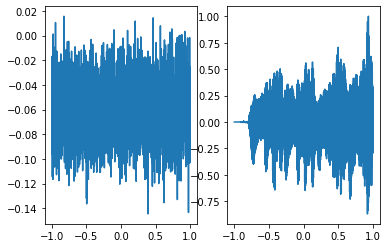

Step 200, Total loss 0.001507


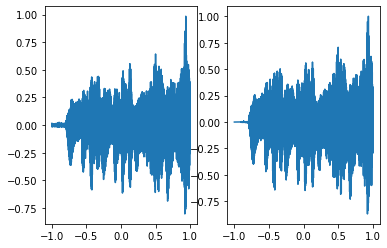

Step 400, Total loss 0.000548


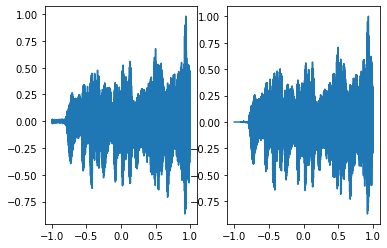

In [ ]:
total_steps = 500
steps_til_summary = 200

optim = torch.optim.Adam(lr=1e-4, params=audio_siren.parameters()) #we use Adam optimizer on audio_Siren's parameters

model_input, ground_truth = next(iter(dataloader)) #import from dataloader and send to GPU
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = audio_siren(model_input)    
    loss = F.mse_loss(model_output, ground_truth) #compute the loss step by step
    #F is a library containing every functional
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
    
        fig, axes = plt.subplots(1,2)
        axes[0].plot(coords.squeeze().detach().cpu().numpy(),model_output.squeeze().detach().cpu().numpy())
        axes[1].plot(coords.squeeze().detach().cpu().numpy(),ground_truth.squeeze().detach().cpu().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

#### Training ReLU

Step 0, Total loss 0.024469


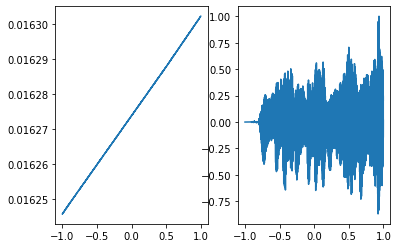

Step 200, Total loss 0.024203


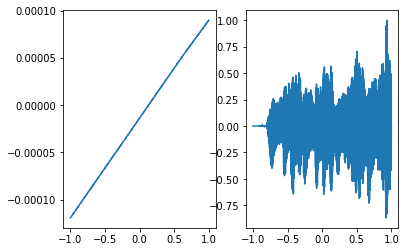

Step 400, Total loss 0.024203


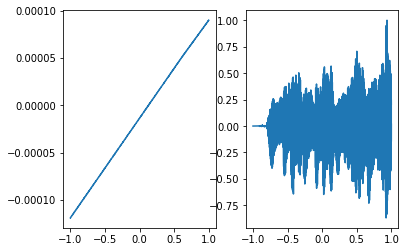

In [ ]:
total_steps = 500
steps_til_summary = 200

optim = torch.optim.Adam(lr=1e-4, params=audio_ReLU.parameters()) #we use Adam optimizer on audio_Siren's parameters

model_input, ground_truth = next(iter(dataloader)) #import from dataloader and send to GPU
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = audio_ReLU(model_input)    
    loss = F.mse_loss(model_output, ground_truth)
    #F is a library containing functionals
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
    
        fig, axes = plt.subplots(1,2)
        axes[0].plot(coords.squeeze().detach().cpu().numpy(),model_output.squeeze().detach().cpu().numpy())
        axes[1].plot(coords.squeeze().detach().cpu().numpy(),ground_truth.squeeze().detach().cpu().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

### Comparing results

In [ ]:
#Audio reconstructed by SIREN

final_model_output_sir, coords = audio_siren(model_input) #reproducing SIREN audio = we hear a little background noise
Audio(final_model_output_sir.cpu().detach().squeeze().numpy(),rate=rate)

In [ ]:
#Audio reconstructed by ReLU

final_model_output_relu, coords = audio_ReLU(model_input) #reproducing ReLU audio = silence
Audio(final_model_output_relu.cpu().detach().squeeze().numpy(),rate=rate)

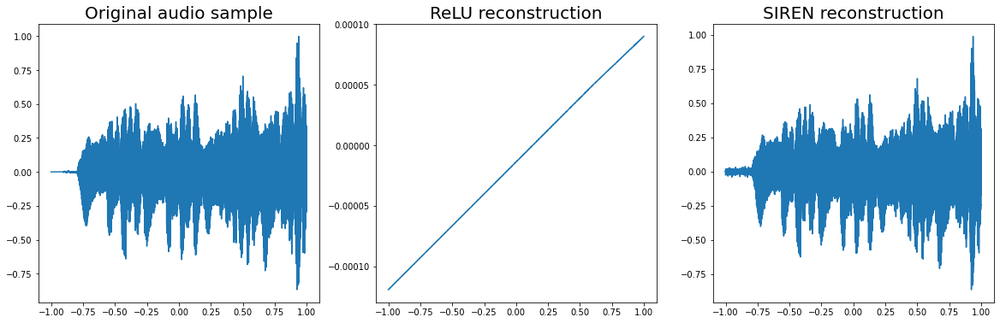

In [ ]:
#Plot of the signals

fig, axes = plt.subplots(1,3, figsize = (20,6))
axes[0].plot(coords.squeeze().detach().cpu().numpy(),ground_truth.squeeze().detach().cpu().numpy())
axes[0].set_title("Original audio sample", fontsize = 20)
axes[1].plot(coords.squeeze().detach().cpu().numpy(),final_model_output_relu.squeeze().detach().cpu().numpy())
axes[1].set_title("ReLU reconstruction", fontsize = 20)
axes[2].plot(coords.squeeze().detach().cpu().numpy(),final_model_output_sir.squeeze().detach().cpu().numpy())
axes[2].set_title("SIREN reconstruction", fontsize = 20)
plt.show()

#3. Ablation studies on simple SIREN

Different initialization of the first layer weights

In [ ]:
#1. First layer Uniform(-1,1)
#2. First layer Gaussian(0,1)
#3. Hidden layers Uniform(-1,1)
#4. Hidden layers Gaussian(0,1)

class SineLayer(nn.Module):
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30): #isfirst mi serve per distinguere i pesi nel caso in cui sto considerando come input del layer l'input della rete oppure un output di un altro layer
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                
                self.linear.weight.uniform_(-1 / self.in_features, 1 / self.in_features) #DEFAULT
                #self.linear.weight.uniform_(-1 , 1) #UNIFORM
                #self.linear.weight.normal_(0, 1) #GAUSSIAN     
            else:

                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, np.sqrt(6 / self.in_features) / self.omega_0) #DEFAULT
                #self.linear.weight.uniform_(-1 , 1) #UNIFORM
                #self.linear.weight.normal_(0, 1) #GAUSSIAN  
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

We studied the output of image fitting by training the SIREN networ with different values for the initialization of the weights and for omega_0 on the different layers. By comparing the results, we noticed the following things:
* By simply looking at the loss, which is evaluated on the image, the higher is the value of the firs omega_0 the better are the results. The performance on the gradient and the laplacian, though, drops. We found a good equilibrium for first_omega_0 = 300
* Changing the initialization of the weights on the first layers to Gaussian(0,1) improves significantly the value of the loss mantaining a good approximation for gradient and laplacian.
* By comparing the 3 best results (default, gaussian initialization and first_omega_0 = 300) we can see that the best approximation of the gradient is performed by the gaussian initialization, whereas the best value for loss and the best-looking laplacian are obtained with first_omega = 300. We tried the combine this studies, but the results were worse than applying them individually.
* The other changes we applied on the initializations of weights or omega_0 didn't produce any significant improvement or even worsened the result

# 4. Simple SIREN for Single Image Super-Resolution

##Data preparation

In [16]:
class SineLayer(nn.Module):
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad(): #sets all the requires_grad to false
            if self.is_first:
                
                self.linear.weight.uniform_(-1 / self.in_features, 1 / self.in_features)
            else:

                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords

##Siren for grayscale images

In [ ]:
#Inizialization of the networks for SISR on 128x128 image lena

dim = 128
image = ImagePreparation('lena512.bmp', dim) #Image preparation preprocess the HR image into a LR input
dataloader = DataLoader(image, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True, first_omega_0 = 60, hidden_omega_0 = 60)
img_siren.cuda()
torch.cuda.empty_cache()

Step 0, Total loss 0.128893569


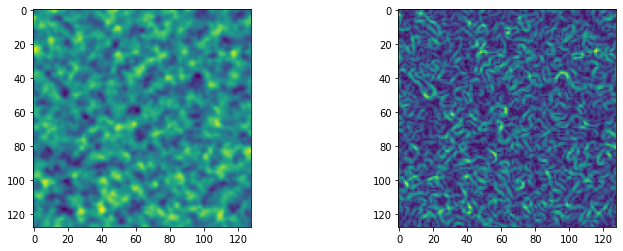

Step 100, Total loss 0.000231549


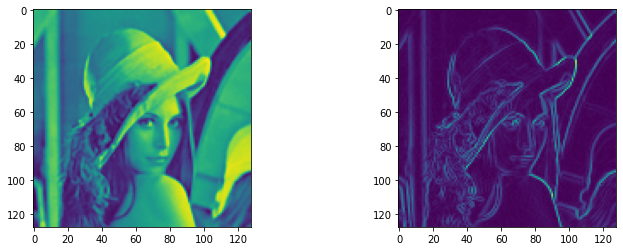

Step 200, Total loss 0.000039846


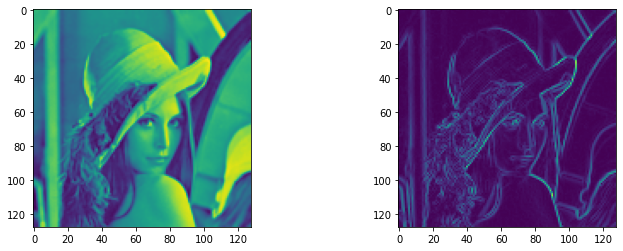

Step 300, Total loss 0.000027400


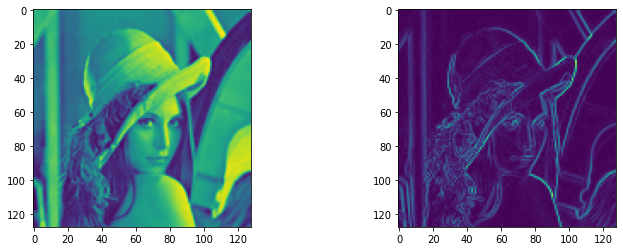

Step 400, Total loss 0.000003939


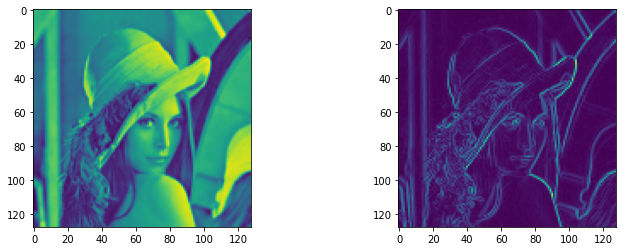

Step 500, Total loss 0.000001671


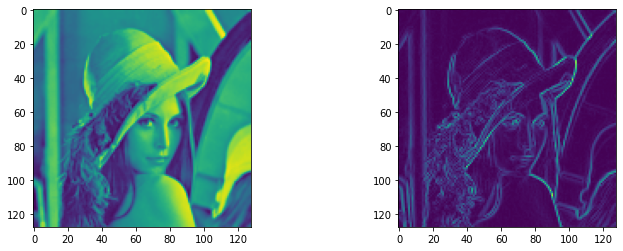

In [ ]:
total_steps = 501 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren(model_input)    
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.9f" % (step, loss))
        img_grad = gradient(model_output, coords).to('cpu')

        fig, axes = plt.subplots(1,2, figsize=(12,4))
        axes[0].imshow(model_output.cpu().view(dim,dim).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(dim,dim).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

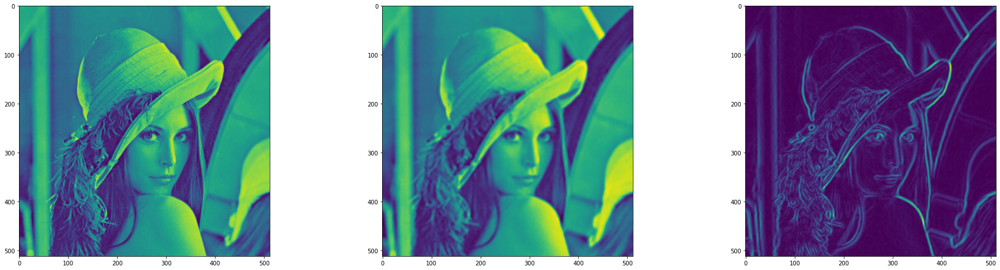

Total loss: 0.007211


In [ ]:
real_image = ImagePreparation('lena512.bmp', 512)
dataloader = DataLoader(real_image, batch_size=1, pin_memory=True, num_workers=0)

model_input, ground_truth = next(iter(dataloader)) 
model_input, ground_truth = model_input.cuda(), ground_truth.cuda() 

model_output, coords = img_siren(model_input) 
loss = ((model_output - ground_truth)**2).mean()
img_grad = gradient(model_output, coords)

#Visualize the gt, the ouput and its gradient
fig, axes = plt.subplots(1,3, figsize=(32,8))
axes[0].imshow(ground_truth.cpu().view(512,512).detach().numpy())
axes[1].imshow(model_output.cpu().view(512,512).detach().numpy())
axes[2].imshow(img_grad.norm(dim=-1).cpu().view(512,512).detach().numpy())
plt.show()
print("Total loss: %0.6f" % (loss)) # Print the final MSE loss of reconstruction

###Bicubic Interpolation and State of the Art

####State of the Art

In [ ]:
#converto l'immagine in bianco e nero
len_bic = Image.open('bicubic_lena.png')
len_gan = Image.open('lena_128_pred_srgan.png')
len_res = Image.open('lena_128_pred_srresnet.png')

len_gan = len_gan.convert('L')
len_res = len_res.convert('L')
len_bic = len_bic.convert('L')
len_gan.save('lena_128_pred_srgan.png')
len_res.save('lena_128_pred_srresnet.png')
len_bic.save('lena_bicubic.png')

In [ ]:
image_gan = ImagePreparation('lena_128_pred_srgan.png', 512)
image_res = ImagePreparation('lena_128_pred_srresnet.png', 512)
image_bic = ImagePreparation('lena_bicubic.png', 512)

dataloader_gan = DataLoader(image_gan, batch_size=1, pin_memory=True, num_workers=0)
dataloader_res = DataLoader(image_res, batch_size=1, pin_memory=True, num_workers=0)
dataloader_bic = DataLoader(image_bic, batch_size=1, pin_memory=True, num_workers=0)

#salvo in len_gan l'immagine originale
_, len_gan = next(iter(dataloader_gan)) #len_gan è al posto del ground_truth
#salvo in len_res l'immagine originale
_, len_res = next(iter(dataloader_res)) #len_res è al posto del ground_truth
#salvo in len_bic l'immagine originale
_, len_bic = next(iter(dataloader_bic)) #len_bic è al posto del ground_truth

In [ ]:
import skimage.metrics as sm

gt = ground_truth.to('cpu')
mo = model_output.to('cpu')
len_gan = len_gan.to('cpu')
len_res = len_res.to('cpu')
len_bic = len_bic.to('cpu')

gt = gt.detach().numpy()
mo = mo.detach().numpy()
len_gan = len_gan.detach().numpy()
len_res = len_res.detach().numpy()
len_bic = len_bic.detach().numpy()


MSE_Siren = sm.mean_squared_error(gt, mo) #calcola il MSE come loss
PSNR_Siren = sm.peak_signal_noise_ratio(gt, mo) #calcola il PSNR come loss migliore
MSE_gan = sm.mean_squared_error(gt, len_gan) #calcola il MSE come loss per gan
PSNR_gan = sm.peak_signal_noise_ratio(gt, len_gan) #calcola il PSNR come loss migliore per gan
MSE_res = sm.mean_squared_error(gt, len_res) #calcola il MSE come loss per res
PSNR_res = sm.peak_signal_noise_ratio(gt, len_res) #calcola il PSNR come loss migliore per res
MSE_bic = sm.mean_squared_error(gt, len_bic) #calcola il MSE come loss per res
PSNR_bic = sm.peak_signal_noise_ratio(gt, len_bic) #calcola il PSNR come loss migliore per res

#confrontiamo gli errori nostri con quelli di gan e res
print('MSE_Siren: ' + str(MSE_Siren))
print('MSE_Bic: ' + str(MSE_Bic))
print('MSE_gan: ' + str(MSE_gan))
print('MSE_res: ' + str(MSE_res))
print('PSNR_Siren: ' + str(PSNR_Siren))
print('PSNR_Bic: ' + str(PSNR_Bic))
print('PSNR_gan: ' + str(PSNR_gan))
print('PSNR_res: ' + str(PSNR_res))

NameError: ignored

##Siren for color images

###Training one Siren network with 3 outputs

In [17]:
#Initialization of the network for the training on 128x128 RGB image

dim = 128
image = ImagePreparation_color('baboon_128.png', dim)
dataloader = DataLoader(image, batch_size=1, pin_memory=True, num_workers=0)

img_siren_col = Siren(in_features=2, out_features=3, hidden_features=512, 
                  hidden_layers=1, outermost_linear=True, first_omega_0 = 170, hidden_omega_0 = 30)

img_siren_col.cuda()

torch.cuda.empty_cache()

In [19]:
#Training on 128x128 image
total_steps = 500 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 100
VGG = VGGPerceptualLoss()
VGG.cuda()
optim = torch.optim.Adam(lr=1e-4, params=img_siren_col.parameters(),weight_decay=0.0)

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren_col(model_input)

    out = model_output.reshape([1,dim,dim,3]).permute([0,3,1,2])
    gt = ground_truth.reshape([1,dim,dim,3]).permute([0,3,1,2])
    mse_loss = ((torch.flatten(model_output - ground_truth))**2).mean()
    #perc12_loss, perc22_loss, perc33_loss, perc43_loss = VGG(gt,out)
    
    

    loss = mse_loss

    #An alternative is to use perceptual losses, based on VGG-16 network

    #loss = perc12_loss
    #loss = perc22_loss
    #loss = perc33_loss
    #loss = perc43_loss
    #loss = mse_loss*5/100 + 0.1*perc12_loss*5/100 + 0.01*perc22_loss*5/100 + 0.01*perc33_loss*5/100 + 0.1*perc43_loss*80/100 #write any linear combination of the previous losses





    
    if not step % steps_til_summary:
        print("3 outputs: Step %d, Total loss %0.9f" % (step, loss))

    optim.zero_grad()
    loss.backward()
    optim.step()

3 outputs: Step 0, Total loss 0.149995893
3 outputs: Step 100, Total loss 0.000049365
3 outputs: Step 200, Total loss 0.000001029
3 outputs: Step 300, Total loss 0.000000037
3 outputs: Step 400, Total loss 0.000000001


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


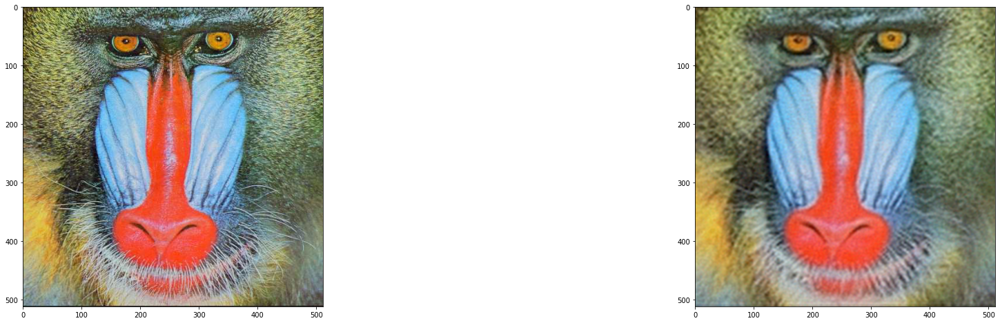

Total loss: 0.035582


In [ ]:
real_image = ImagePreparation_color('baboon.png', 512)
dataloader = DataLoader(real_image, batch_size=1, pin_memory=True, num_workers=0) #dataloader tira fuori un batch, nel nostro caso un'unica immagine

model_input, ground_truth = next(iter(dataloader)) 
model_input, ground_truth = model_input.cuda(), ground_truth.cuda() #mando alla gpu

model_output, coords = img_siren_col(model_input) 
loss = ((model_output - ground_truth)**2).mean() 

#img_grad = gradient_color(model_output, coords).reshape(512,512,3)
#img_laplacian = laplace_color(model_output, coords).reshape(256,256,3)

fig, axes = plt.subplots(1,2, figsize=(32,8))
axes[0].imshow(map_to_01(ground_truth).cpu().view(512,512,3).detach().numpy())
axes[1].imshow(map_to_01(model_output).cpu().view(512,512,3).detach().numpy())
#axes[2].imshow(map_to_01(img_grad,flag = True).reshape(512,512,3))

plt.show()

print("Total loss: %0.6f" % (loss))

In [ ]:
img_grad = gradient_color(model_output, coords)

from torchvision.utils import save_image

save_image(map_to_01(img_grad,flag = True).reshape(512,512,3).permute(2,0,1), 'baboon_gradient.png')

del img_grad

####Comparison with state of the art: GAN and Resnet

In [ ]:
#Importing the images reconstructed with state of the art methods like SRGAN and SRRESNET
image_gan = ImagePreparation_color('baboon_SRGAN3.png', 512)
image_res = ImagePreparation_color('baboon_SRRESNET.png', 512)

dataloader_gan = DataLoader(image_gan, batch_size=1, pin_memory=True, num_workers=0)
dataloader_res = DataLoader(image_res, batch_size=1, pin_memory=True, num_workers=0)


_, bab_gan = next(iter(dataloader_gan))
_, bab_res = next(iter(dataloader_res))

In [ ]:
import skimage.metrics as sm

gt = ground_truth.to('cpu')
mo = model_output.to('cpu')

gt = gt.detach().numpy()
mo = mo.detach().numpy()
bab_gan = bab_gan.detach().numpy()
bab_res = bab_res.detach().numpy()



MSE_Siren = sm.mean_squared_error(gt, mo)
PSNR_Siren = sm.peak_signal_noise_ratio(gt, mo)
MSE_gan = sm.mean_squared_error(gt, bab_gan)
PSNR_gan = sm.peak_signal_noise_ratio(gt, bab_gan) 
MSE_res = sm.mean_squared_error(gt, bab_res) 
PSNR_res = sm.peak_signal_noise_ratio(gt, bab_res)


#Measures of similarity between ground truth and the different reconstructions
print('MSE_Siren: ' + str(MSE_Siren))
#print('MSE_Bic: ' + str(MSE_Bic))
print('MSE_gan: ' + str(MSE_gan))
print('MSE_res: ' + str(MSE_res))
print('PSNR_Siren: ' + str(PSNR_Siren))
#print('PSNR_Bic: ' + str(PSNR_Bic))
print('PSNR_gan: ' + str(PSNR_gan))
print('PSNR_res: ' + str(PSNR_res))

MSE_Siren: 0.035582312550277335
MSE_gan: 0.04399523841937619
MSE_res: 0.03054297522110454
PSNR_Siren: 20.508258211835567
PSNR_gan: 19.586543157529427
PSNR_res: 21.17148651496471


###Training 3 Siren networks: one per color

In [ ]:
#Splitting the image in its three colors

dim = 128
image = Image.open('baboon.png')

if image.mode=='L': #se fosse in bianco e nero la converto
    image=image.convert('RGB')

red, green, blue = image.split() #split mi separa i 3 colori

red.save('image_red.jpg')
image_red = ImagePreparation('image_red.jpg', dim)

green.save('image_green.jpg')
image_green = ImagePreparation('image_green.jpg', dim)

blue.save('image_blue.jpg')
image_blue = ImagePreparation('image_blue.jpg', dim)

In [ ]:
#Initialization of the three networks, one per color

dataloader_r = DataLoader(image_red, batch_size=1, pin_memory=True, num_workers=0)
dataloader_g = DataLoader(image_green, batch_size=1, pin_memory=True, num_workers=0)
dataloader_b = DataLoader(image_blue, batch_size=1, pin_memory=True, num_workers=0)


img_siren_r = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True, first_omega_0 = 60, hidden_omega_0 = 60)
img_siren_g = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True, first_omega_0 = 60, hidden_omega_0 = 60)
img_siren_b = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True, first_omega_0 = 60, hidden_omega_0 = 60)
img_siren_r.cuda()
img_siren_g.cuda()
img_siren_b.cuda()


Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)

Step 0, loss_r 0.155389279, loss_g 0.093193799, loss_b 0.199924484


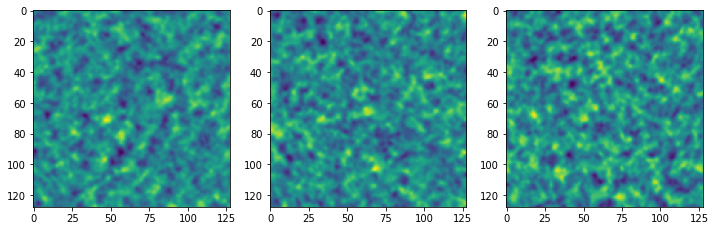

Step 100, loss_r 0.000900717, loss_g 0.000499164, loss_b 0.000962007


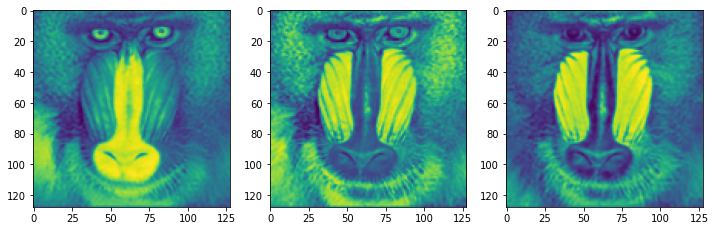

Step 200, loss_r 0.000108905, loss_g 0.000059227, loss_b 0.000192409


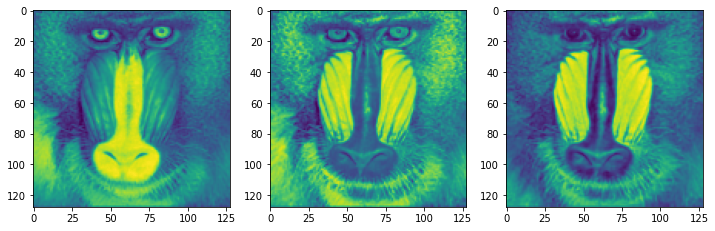

Step 300, loss_r 0.000015669, loss_g 0.000001662, loss_b 0.000034381


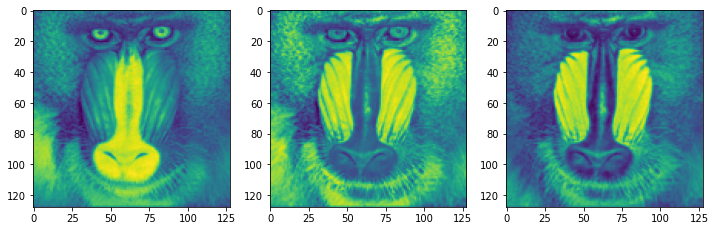

Step 400, loss_r 0.000002796, loss_g 0.000000182, loss_b 0.000007426


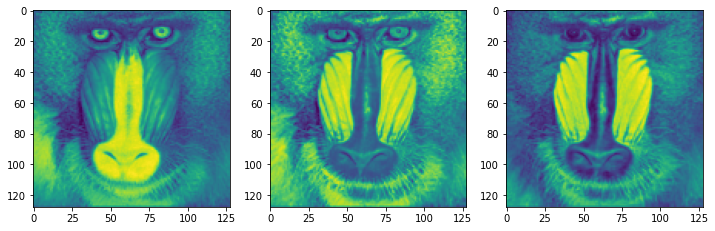

Step 500, loss_r 0.000000589, loss_g 0.000170615, loss_b 0.000003837


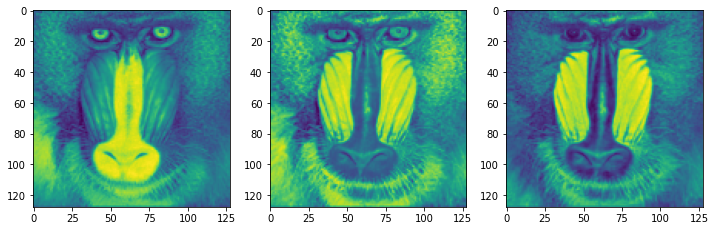

In [ ]:
#Training of the three networks

total_steps = 501 # 
steps_til_summary = 100

optim_r = torch.optim.Adam(lr=1e-4, params=img_siren_r.parameters())
optim_g = torch.optim.Adam(lr=1e-4, params=img_siren_g.parameters())
optim_b = torch.optim.Adam(lr=1e-4, params=img_siren_b.parameters())

model_input_r, ground_truth_r = next(iter(dataloader_r))
model_input_r, ground_truth_r = model_input_r.cuda(), ground_truth_r.cuda()
model_input_g, ground_truth_g = next(iter(dataloader_g))
model_input_g, ground_truth_g = model_input_g.cuda(), ground_truth_g.cuda()
model_input_b, ground_truth_b = next(iter(dataloader_b))
model_input_b, ground_truth_b = model_input_b.cuda(), ground_truth_b.cuda()

for step in range(total_steps):

    model_output_r, coords_r = img_siren_r(model_input_r)    
    loss_r = ((model_output_r - ground_truth_r)**2).mean()
    model_output_g, coords_g = img_siren_g(model_input_g)    
    loss_g = ((model_output_g - ground_truth_g)**2).mean()
    model_output_b, coords_b = img_siren_b(model_input_b)    
    loss_b = ((model_output_b - ground_truth_b)**2).mean()
    
    if not step % steps_til_summary:
         print("Step %d, loss_r %0.9f, loss_g %0.9f, loss_b %0.9f" % (step, loss_r, loss_g, loss_b))
    #     img_grad = gradient(model_output, coords).to('cpu')
    #     img_laplacian = laplace(model_output, coords).to('cpu')

         fig, axes = plt.subplots(1,3, figsize=(12,4))
         axes[0].imshow(model_output_r.cpu().view(dim,dim).detach().numpy())
         axes[1].imshow(model_output_g.cpu().view(dim,dim).detach().numpy())
         axes[2].imshow(model_output_b.cpu().view(dim,dim).detach().numpy())
         plt.show()

    optim_r.zero_grad()
    optim_g.zero_grad()
    optim_b.zero_grad()
    loss_r.backward()
    loss_g.backward()
    loss_b.backward()
    optim_r.step()
    optim_g.step()
    optim_b.step()

In [ ]:
#Super resolution with the three networks

real_image = ImagePreparation_color('baboon.png', 512)
dataloader = DataLoader(real_image, batch_size=1, pin_memory=True, num_workers=0) #dataloader tira fuori un pixel alla volta credo


model_input, ground_truth = next(iter(dataloader)) 
model_input, ground_truth = model_input.cuda(), ground_truth.cuda() #mando alla gpu

model_output_r, coords = img_siren_r(model_input)    #faccio girare la rete per r
img_grad_r = gradient(model_output_r, coords).norm(dim=-1)
model_output_g, coords = img_siren_g(model_input)    #faccio girare la rete per g
img_grad_g = gradient(model_output_g, coords).norm(dim=-1)
model_output_b, coords = img_siren_b(model_input)    #faccio girare la rete per b
img_grad_b = gradient(model_output_b, coords).norm(dim=-1)

#Merging the three outputs
model_output_col = torch.cat((model_output_r,model_output_g,model_output_b),-1)

#gradient_col = torch.cat((img_grad_r,img_grad_g,img_grad_b),0).permute(1,0).reshape(512,512,3)

fig, axes = plt.subplots(1,2, figsize=(32,8))
axes[0].imshow(map_to_01(ground_truth).cpu().view(256,256,3).detach().numpy())
axes[1].imshow(map_to_01(model_output_col).cpu().view(256,256,3).detach().numpy())
#axes[2].imshow(map_to_01(gradient_col,True).cpu().detach().numpy())
plt.show()

loss = ((model_output_col - ground_truth)**2).mean() #calcolo il MSE
#loss_grad = ((img_grad - orig_grad)**2).mean() #calcolo il MSE per il gradiente
#print("Total loss: %0.6f Total loss_grad: %0.6f" % (loss,loss_grad))
print("Total loss: %0.6f " % (loss))

RuntimeError: ignored

#5. Our variation: composed network for Single Image Super-Resolution

## Defining the composed network

This network is the union of two different networks.
The first one is a convolutional network which takes as input an image and return a vector as output.
The second one is the SIREN network. The vector of the first net is used to build the matrix of weights of the first layer of the SIREN network, which will be multiplied by the input coordinates.

Therefore we have two inputs to our composed network: the image for the convolutional part and the coordinates for the SIREN part, which will be multiplied with the output of the first part

In [12]:
##Definition of the convolutional part of the network. 
'''It's composed of 4 convolutional layers with ReLU activation, each one followed by a MaxPool, and 2 fully connected layers.
The network is build to process a (3x128x128) image

in_channels: int, the initial depth of the image (1 if B/W, 3 if RGB)
out_channels: int, the number of features which will result from the multiplication between the coordinates and the matrix of weights generated by this network'''
class ConvNet(nn.Module):
     
    def __init__(self, in_channels, out_channels,drop_out):
        super().__init__()
        self.drop = nn.Dropout(p=drop_out)
        self.conv1 = nn.Conv2d(in_channels, 6, 9) #(spessore input, spessore output, larghezza quadrato)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 12, 5)
        self.conv3 = nn.Conv2d(12, 16, 5)
        self.conv4 = nn.Conv2d(16, 20, 3)
        self.fc1 = nn.Linear(20 * 5 * 5, 100)
        self.fc2 = nn.Linear(100, 2*out_channels)

    def forward(self, x):
        #print('Input: ' +str(x.shape))
        x = self.drop(x)
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = self.pool(F.relu(self.conv4(x)))
        x = x.reshape(-1, 20 * 5 * 5) #diventa un vettore (1,500) da (1,20,5,5)
        x = F.relu(self.fc1(x))
        x = F.tanh(self.fc2(x)) #we want the output in [-1,1]
        return x      

#Definition of the generic layer of the SIREN network
'''in_features: int, input features of the layer
out features: int, output features of the layer
is_first: boolean, defines if the layer is the first of the SIREN. If is_first, there will be a different initialization of the weights
bias: boolean, defines if the layer uses bias in forward computation
omega_0: int, defines the value of omega_0 in this layer'''
class SineLayer(nn.Module):
    
    def __init__(self, in_features, out_features, is_first = False, bias=True, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0    
        self.in_features = in_features
        self.is_first = is_first
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        self.init_weights()
        
    
    def init_weights(self):
      with torch.no_grad():
        if self.is_first:
          #Initialization of the weights for the first layer ~ Uniform( -sqrt(6/n) / omega_0 , -sqrt(6/n) / omega_0  )
            self.linear.weight.uniform_(-1 / self.in_features, 1 / self.in_features)
        else:
           #Initialization of the weights for the other layers ~ Uniform( -sqrt(6/n) / omega_0 , -sqrt(6/n) / omega_0  )
            self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, np.sqrt(6 / self.in_features) / self.omega_0) #DEFAULT
    
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))

#Definition of composed network
'''in_channels: int, corresponds to out_channel of the previous network
in_features: int, input of the SIREN network (1 for B/W images, 3 for RGB)
hidden_layers: int,  number of hidden layers of the SIREN
hidden_features: int, number of the features in each hidden layer of the SIREN
first_omega_0: int, value of omega_0 in the first layer of the SIREN
omega_0: int, value of omega_0 in the other layers of the SIREN
out_features: int, output of the SIREN network (1 for B/W images, 3 for RGB)
'''    
class SirenComposed(nn.Module):
    def __init__(self, in_channels, first_features, hidden_layers, out_features, hidden_features=256,
                 first_omega_0=30, hidden_omega_0=30, drop_out=0):
        super().__init__()
        self.first_omega_0 = first_omega_0
        self.first_features = first_features

        #Initialization of the convolutional network
        self.conv_net = []
        self.conv_net.append(ConvNet(in_channels,first_features,drop_out))
        self.conv_net = nn.Sequential(*self.conv_net)

        #Initalization of the SIREN network
        self.net = []
        self.net.append(SineLayer(first_features, hidden_features, is_first = True, omega_0=first_omega_0))
        for i in range(hidden_layers-1):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                       omega_0=hidden_omega_0))
        self.net.append(SineLayer(hidden_features, out_features, 
                                       omega_0=hidden_omega_0))
        self.net = nn.Sequential(*self.net)
    

    def forward(self, coords, image):
        batch_size = image.shape[0] #If the network process more than one image in parallel we need to save the batch size to use it later
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        weights = self.conv_net(image) #forward of the convolutional part. weights is now a batch_sizex1x(2*first_features) tensor. It needs to be reshaped into a matrix
        self.weights = weights
        #print('Shape of coords: ' + str(coords.shape))
        #print('Shape of weights: ' + str(weights.shape))
        #inter_output = torch.sin(self.first_omega_0 * torch.matmul(coords, weights.reshape([batch_size,self.first_features,2]).permute(0,2,1))) #multiplication of the input coordinates by the reshaped matrix of weights 
        inter_output = torch.matmul(coords, weights.reshape([batch_size,self.first_features,2]).permute(0,2,1)) #multiplication of the input coordinates by the reshaped matrix of weights 
        self.inter_output = inter_output
        output = self.net(inter_output) #forward of the SIREN net
        return output, coords
    

## Full training: updating all the weights in the network at every step, without freezing

We first tried to make the network reconstruct a batch of images (size 128x128) by using MSE between the output and the ground truth as loss. All the layers of the network were than updated at the same time after each batch  of images. This network is therefore able to reconstruct groups of images, with poor results. The purpose of this part is to train the convolutional part to reconstruct a generic image.



/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1628: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


Epoch 100, Batch 1, Total loss 0.154857367
Epoch 100, Batch 2, Total loss 0.157397971
Epoch 100, Batch 3, Total loss 0.194942817
Epoch 100, Batch 4, Total loss 0.145745158
Epoch 100, Batch 5, Total loss 0.152293101
Epoch 100, Batch 6, Total loss 0.125380442
Epoch 200, Batch 1, Total loss 0.092655726
Epoch 200, Batch 2, Total loss 0.094212376
Epoch 200, Batch 3, Total loss 0.093197942
Epoch 200, Batch 4, Total loss 0.086477928
Epoch 200, Batch 5, Total loss 0.096953094
Epoch 200, Batch 6, Total loss 0.077476867
Epoch 300, Batch 1, Total loss 0.075329319
Epoch 300, Batch 2, Total loss 0.100780755
Epoch 300, Batch 3, Total loss 0.104312442
Epoch 300, Batch 4, Total loss 0.080977179
Epoch 300, Batch 5, Total loss 0.085643783
Epoch 300, Batch 6, Total loss 0.077928163
Epoch 400, Batch 1, Total loss 0.058680229
Epoch 400, Batch 2, Total loss 0.067051664
Epoch 400, Batch 3, Total loss 0.071991958
Epoch 400, Batch 4, Total loss 0.063294776
Epoch 400, Batch 5, Total loss 0.066313140
Epoch 400, 

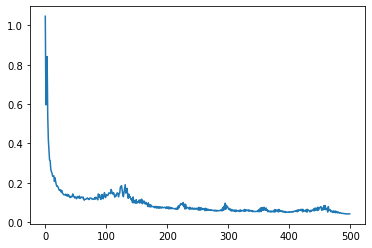

In [13]:
#Training on 128x128 images
dim = 128
folder = 'div2k' #folder with 90 images from div2k dataset
batch_size = 15
regu=0

datasetimages = DatasetImages(folder,dim) #initializes the dataset of images, to be processed by the dataloder
dataloader = DataLoader(datasetimages, batch_size=batch_size, pin_memory=True, num_workers=0)  #the dataloader will extract a batch_size number of images from the dataset everytime it's called

iper_img_siren_col = SirenComposed(in_channels=3, first_features = 6, hidden_layers=3, out_features=3, hidden_features=512,
                first_omega_0=150, hidden_omega_0=30) #initializes the net
iper_img_siren_col.cuda() #moves the net to cuda

total_steps = 500 #total number of epochs. Each epoch is a training of the whole dataset, in groups of small batches
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-4, params=iper_img_siren_col.parameters(),weight_decay=regu)

results = []

for step in range(total_steps):
  for i,data in enumerate(dataloader,0): #the dataloader calls the method _getitem_ from the dataset to extract #batch_size items. Each item is a couple with the grid and the image, saved in data
    model_input, ground_truth = data
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

    model_output, coords = iper_img_siren_col(model_input,ground_truth.reshape([batch_size,dim,dim,3]).permute([0,3,1,2])) #the forward of the netowrk is run
    loss = ((torch.flatten(model_output - ground_truth))**2).mean()
    
    if  step % steps_til_summary == (steps_til_summary-1):
        print("Epoch %d, Batch %d, Total loss %0.9f" % (step+1, i+1, loss))
    
    optim.zero_grad()
    loss.backward()
    optim.step()
  results.append(loss)
plt.plot(results)

If we want to improve the results on a single image, we need to train the SIREN part of the network to reconstruct that specific image. We can do so by freezing the convolutional part, which we created to be as generic as possible, and updating the weights of the SIREN by using the image to be super-resoluted

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1628: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


Epoch 100, Batch 1, Total loss 0.023158435
Epoch 200, Batch 1, Total loss 0.016941212
Epoch 300, Batch 1, Total loss 0.014754849
Epoch 400, Batch 1, Total loss 0.013097025
Epoch 500, Batch 1, Total loss 0.011629893
Epoch 600, Batch 1, Total loss 0.010391013
Epoch 700, Batch 1, Total loss 0.009453820
Epoch 800, Batch 1, Total loss 0.008849628
Epoch 900, Batch 1, Total loss 0.008470040
Epoch 1000, Batch 1, Total loss 0.007969395
Epoch 1100, Batch 1, Total loss 0.007493562
Epoch 1200, Batch 1, Total loss 0.007101658
Epoch 1300, Batch 1, Total loss 0.007183663
Epoch 1400, Batch 1, Total loss 0.007252065
Epoch 1500, Batch 1, Total loss 0.006607079


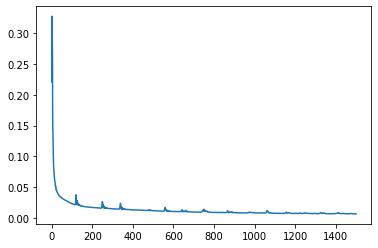

In [14]:
dim = 128
folder = 'test_image' #folder with the test_image
batch_size = 1
regu=0

datasetimages = DatasetImages(folder,dim)
dataloader = DataLoader(datasetimages, batch_size=batch_size, pin_memory=True, num_workers=0)

#This couple of commands sets "requires_grad" of the convolutional layers to False and set the optimizer to update only the parameters with "requires_grad" = True
def_requires_grad(iper_img_siren_col.conv_net,False) #freeze the convolutional (if = false we don't update it)
optim = torch.optim.Adam(filter(lambda p: p.requires_grad, iper_img_siren_col.parameters()), lr=1e-4, amsgrad=True,weight_decay=regu)

total_steps = 1500
steps_til_summary = 100

results = []

for step in range(total_steps):
  for i,data in enumerate(dataloader,0):
    model_input, ground_truth = data
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

    model_output, coords = iper_img_siren_col(model_input,ground_truth.reshape([batch_size,dim,dim,3]).permute([0,3,1,2]))    
    loss = ((torch.flatten(model_output - ground_truth))**2).mean()
    
    if  step % steps_til_summary == (steps_til_summary-1):
        print("Epoch %d, Batch %d, Total loss %0.9f" % (step+1, i+1, loss))
    
    optim.zero_grad()
    loss.backward()
    optim.step()
  results.append(loss)
plt.plot(results)

### Visualization of the reconstruction results

Ground truth
Model output


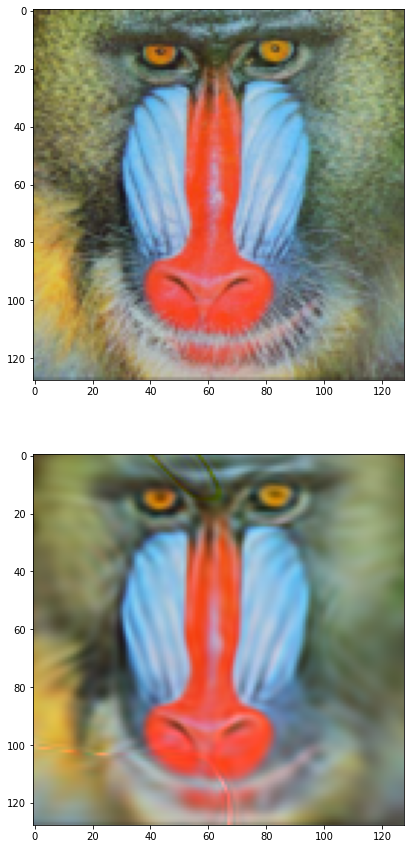

In [15]:
fig, axes = plt.subplots(2,batch_size, figsize=(30,15))
print('Ground truth')
axes[0].imshow(map_to_01(ground_truth).cpu().view(dim,dim,3).detach().numpy())
print('Model output')
axes[1].imshow(map_to_01(model_output).cpu().view(dim,dim,3).detach().numpy())
plt.show()

##Fine tuning training: updating the CNN weights only after intermediate inner trainings of the SIREN on every image

We wanted to further improve the parameters of the convolutional network. We used batches of one image and re-trained the SIREN network each time to get the best results as possible from the single image. This should adapt the outputs of the convolutional network  to be used in a fully functional SIREN

In [ ]:
from tqdm import tqdm

dim = 128
folder = 'div2k'
batch_size = 1
datasetimages = DatasetImages(folder,dim)
dataloader = DataLoader(datasetimages, batch_size=batch_size, pin_memory=True, num_workers=0)

VGG = VGGPerceptualLoss()
VGG.cuda()

iper_img_siren_col = SirenComposed(in_channels=3, first_features = 6, hidden_layers=3, out_features=3, hidden_features=512,
                first_omega_0=150, hidden_omega_0=30)
iper_img_siren_col.cuda()


total_steps = 16 #an epoch is the processing of all the 90 images of the dataset. For each of the images there will be a SIREN training, therefore we must use a smaller number of epochs
steps_til_summary = 1
total_inner_steps = 100 #epochs of the inner SIREN training
inner_steps_til_summary = 20
optim = torch.optim.Adam(lr=1e-4, params=iper_img_siren_col.parameters())

results_epoch = []
for step in range(total_steps):
  results = []
  for i,data in tqdm(enumerate(dataloader,0)):
    model_input, ground_truth = data
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

    #freezes the convolutional part for the inner SIREN training
    def_requires_grad(iper_img_siren_col.conv_net,False) #freeza la convolutional
    optim2 = torch.optim.Adam(filter(lambda p: p.requires_grad, iper_img_siren_col.parameters()), lr=1e-4, amsgrad=True)

    #Inner SIREN training
    for inner_step in range(total_inner_steps):
          model_output, coords = iper_img_siren_col(model_input,ground_truth.reshape([batch_size,dim,dim,3]).permute([0,3,1,2]))    
          loss2 = ((torch.flatten(model_output - ground_truth))**2).mean()
          
          optim2.zero_grad()
          loss2.backward()
          optim2.step()

    #Unfreezes the convolutional part to update its parameters by using the fully trained SIREN
    def_requires_grad(iper_img_siren_col.conv_net,True) #unfreezes the convolutional
    model_output, coords = iper_img_siren_col(model_input,ground_truth.reshape([batch_size,dim,dim,3]).permute([0,3,1,2]))    

    out = model_output.reshape([1,dim,dim,3]).permute([0,3,1,2])
    gt = ground_truth.reshape([1,dim,dim,3]).permute([0,3,1,2])
    mse_loss = ((torch.flatten(model_output - ground_truth))**2).mean()
    #perc12_loss, perc22_loss, perc33_loss, perc43_loss = VGG(gt,out)
    
    

    loss = mse_loss

    #An alternative is to use perceptual losses, based on VGG-16 network

    #loss = perc12_loss
    #loss = perc22_loss
    #loss = perc33_loss
    #loss = perc43_loss
    #loss = mse_loss*5/100 + 0.1*perc12_loss*5/100 + 0.01*perc22_loss*5/100 + 0.01*perc33_loss*5/100 + 0.1*perc43_loss*80/100 #write any linear combination of the previous losses

    optim.zero_grad()
    loss.backward()
    optim.step()
    results.append(loss)


  print("\n\nOuter Epoch %d, Image %d, Total loss %0.9f" % (step+1, i+1, loss))
  results_epoch.append(torch.mean(torch.stack(results)))

0it [00:00, ?it/s]/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1628: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
90it [01:07,  1.33it/s]
0it [00:00, ?it/s]



Outer Epoch 1, Image 90, Total loss 7.399781227


90it [01:07,  1.33it/s]
0it [00:00, ?it/s]



Outer Epoch 2, Image 90, Total loss 3.941206694


90it [01:07,  1.33it/s]
0it [00:00, ?it/s]



Outer Epoch 3, Image 90, Total loss 2.248407364


47it [00:35,  1.33it/s]

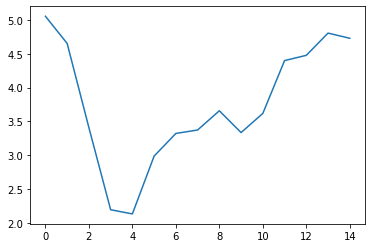

In [ ]:
plt.plot(results_epoch)

### SISR with composed network after training

We can now try to perform super resolution with the trained net. This can be done by training one last time the SIREN part to adapt to the test image and run the network on a denser grid

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1628: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")




Epoch 100, Total loss 0.009281499


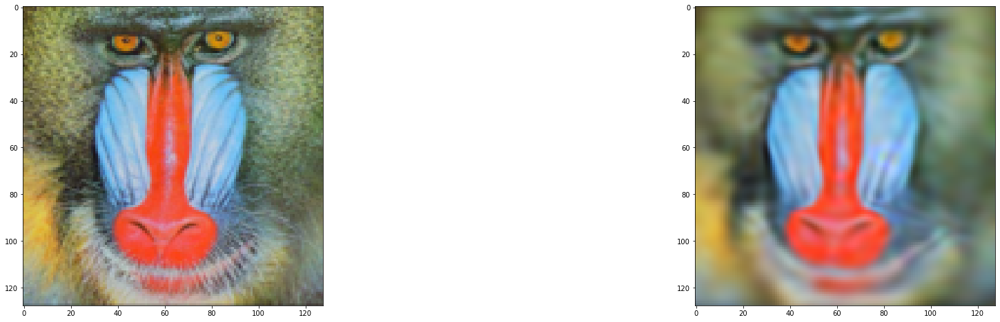



Epoch 200, Total loss 0.006944510


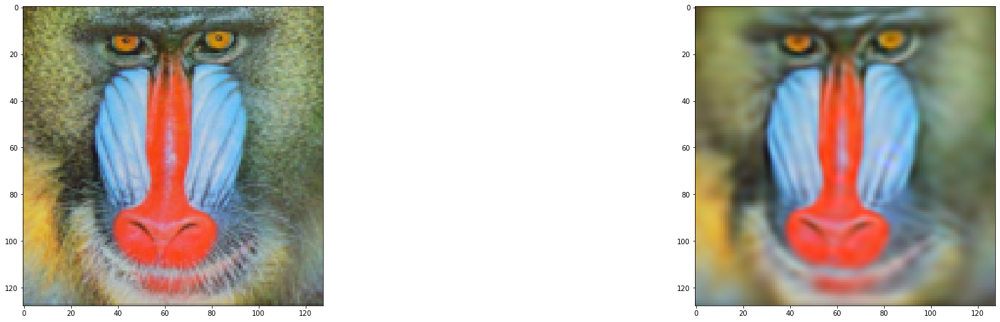



Epoch 300, Total loss 0.006774683


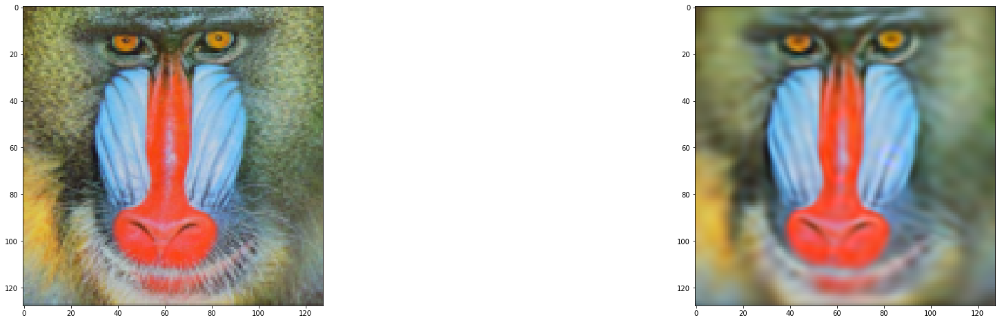



Epoch 400, Total loss 0.005889176


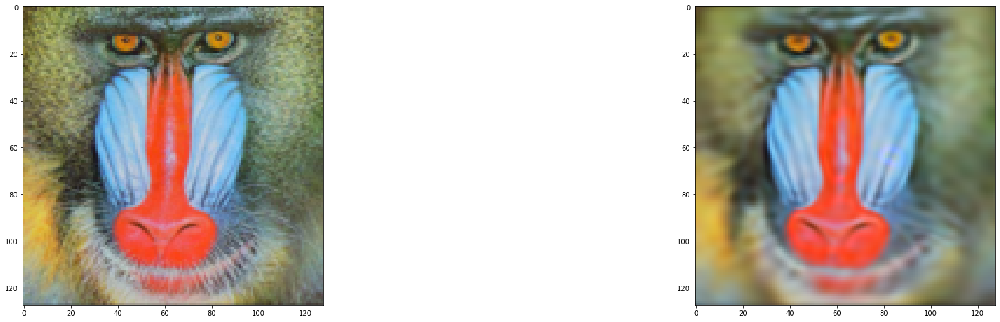



Epoch 500, Total loss 0.005581963


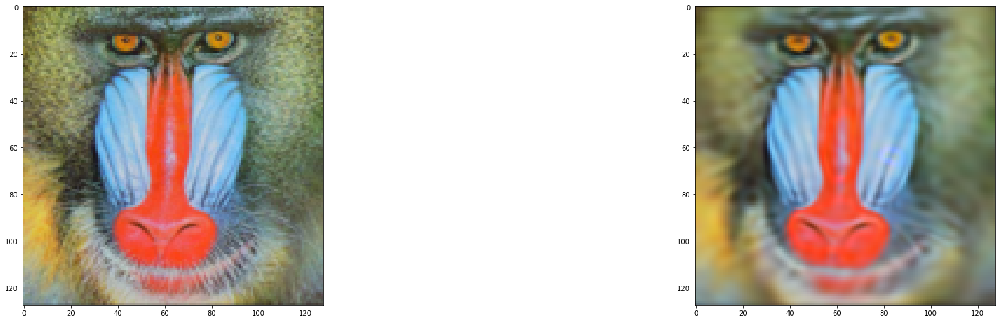

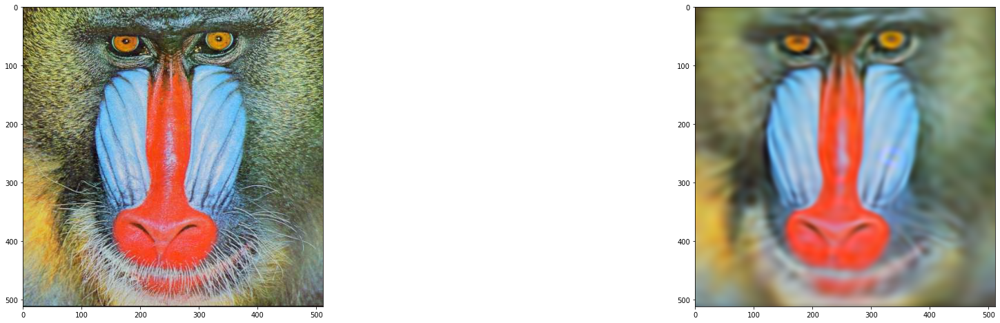

MSE_Siren: 0.042915619392335375    PSNR_Siren: 19.694446063385744


In [ ]:
scaling_factor = 4
dim = 128
dim_super = dim*scaling_factor
folder = 'test_image'
batch_size = 1
datasetimages = DatasetImages(folder,dim)
datasetimages_super = DatasetImages(folder,dim_super)

dataloader = DataLoader(datasetimages, batch_size=batch_size, pin_memory=True, num_workers=0)
dataloader_super = DataLoader(datasetimages_super, batch_size=batch_size, pin_memory=True, num_workers=0)

def_requires_grad(iper_img_siren_col.conv_net,False) #freeze the (optimal) convolutional to train only the SIREN

total_steps = 500
steps_til_summary = 100


optim = torch.optim.Adam(filter(lambda p: p.requires_grad, iper_img_siren_col.parameters()), lr=1e-4, amsgrad=True)

model_input, ground_truth = next(iter(dataloader))
model_input_super, ground_truth_super = next(iter(dataloader_super))

model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
model_input_super, ground_truth_super = model_input_super.cuda(), ground_truth_super.cuda()

results = []
#SIREN training
for step in range(total_steps):
    model_output, coords = iper_img_siren_col(model_input,ground_truth.reshape([batch_size,dim,dim,3]).permute([0,3,1,2]))    
    loss = ((torch.flatten(model_output - ground_truth))**2).mean()
    
    if  step % steps_til_summary == (steps_til_summary-1):
        print("\n\nEpoch %d, Total loss %0.9f" % (step+1, loss))

        fig, axes = plt.subplots(1,2, figsize=(32,8))
        axes[0].imshow(map_to_01(ground_truth).cpu().view(dim,dim,3).detach().numpy())
        axes[1].imshow(map_to_01(model_output).cpu().view(dim,dim,3).detach().numpy())
        plt.show()
    
    optim.zero_grad()
    loss.backward()
    optim.step()
    results.append(loss)

#Super resolution on the trained SIREN network
model_output_super, coords = iper_img_siren_col(model_input_super,ground_truth.reshape([batch_size,dim,dim,3]).permute([0,3,1,2]))    #faccio girare la rete
loss = ((model_output_super - ground_truth_super)**2).mean() #calcolo il MSE


#Plot of the ground truth and the output of the super resolution
fig, axes = plt.subplots(1,2, figsize=(32,8))
axes[0].imshow(map_to_01(ground_truth_super).cpu().view(dim_super,dim_super,3).detach().numpy())
axes[1].imshow(map_to_01(model_output_super).cpu().view(dim_super,dim_super,3).detach().numpy())
plt.show()

import skimage.metrics as sm

gt = ground_truth_super.to('cpu')
mo = model_output_super.to('cpu')

gt = gt.detach().numpy()
mo = mo.detach().numpy()

MSE_Siren = sm.mean_squared_error(gt, mo) #MSE
PSNR_Siren = sm.peak_signal_noise_ratio(gt, mo) #PSNR

print('MSE_Siren: ' + str(MSE_Siren) + '    ' + 'PSNR_Siren: ' + str(PSNR_Siren))